In [1]:
from mario_replays.load_data import load_replay_data
import os
import pandas as pd
import numpy as np

In [6]:
# Load data

df_list = []
sourcedata = '../../mario_learning.behavior/sourcedata/'
output_csv = '../outputdata/clips_metadata.csv'
if not os.path.exists(output_csv):    
    for clips_dir in os.listdir(sourcedata):
        if 'replays' not in clips_dir and '.' not in clips_dir: 
            print(clips_dir)
            sidecars_df = load_replay_data(os.path.join(sourcedata, clips_dir), type='metadata')
            
            if "StateClipCode" in sidecars_df.columns:
                sidecars_df = sidecars_df.rename(columns={"StateClipCode": "ClipCode"})
            df_list.append(sidecars_df)

    full_df = pd.concat(df_list)
    full_df.loc[full_df["Model"].isnull(), "Model"] = "human"
    full_df.to_csv(output_csv, index=False)
else:
    full_df = pd.read_csv(output_csv)


# Split early and late part of the phases.
mask = full_df["Model"].eq("human")
med = (
    full_df.loc[mask]
           .groupby(["Subject", "Phase", "LevelFullName"])["ClipCode"]
           .transform("median")
)
full_df.loc[mask, "Phase_stage"] = np.where(
    full_df.loc[mask, "ClipCode"] < med,
    "Early",
    "Late"
)

full_df

/tmp/ipykernel_108694/2319178699.py:20: DtypeWarning: Columns (1,6,26,27,31) have mixed types. Specify dtype option on import or set low_memory=False.
  full_df = pd.read_csv(output_csv)


,Model,StateFileName,LevelFullName,Scene,ClipCode,TotalFrames,Bk2Filepath,GameName,Subject,World,...,Run,StartFrame,EndFrame,Bk2File,SceneFullName,IndexInRun,IndexGlobal,IndexLevel,Phase,Phase_stage
0,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l2,0,102000000116,188,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l3,1,103050000227,72,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w2l1,10,104060001144,143,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l1,0,101000000122,127,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l1,0,101010000122,127,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336841,human,NaN,w6l2,12,2504030006642,12456,NaN,SuperMarioBros-Nes,6,6,...,4.0,6642.0,6825.0,sub-06_ses-025_run-04_level-w6l2_scene-12_clip...,w6l2s12,3.0,604.0,24.0,practice,Late
336842,human,NaN,w6l2,12,2504030010047,12456,NaN,SuperMarioBros-Nes,6,6,...,4.0,10047.0,10276.0,sub-06_ses-025_run-04_level-w6l2_scene-12_clip...,w6l2s12,3.0,604.0,24.0,practice,Late
336843,human,NaN,w6l2,13,2504030006825,12456,NaN,SuperMarioBros-Nes,6,6,...,4.0,6825.0,7320.0,sub-06_ses-025_run-04_level-w6l2_scene-13_clip...,w6l2s13,3.0,604.0,24.0,practice,Late
336844,human,NaN,w6l2,13,2504030010276,12456,NaN,SuperMarioBros-Nes,6,6,...,4.0,10276.0,10742.0,sub-06_ses-025_run-04_level-w6l2_scene-13_clip...,w6l2s13,3.0,604.0,24.0,practice,Late


    SceneFullName   Duration
0          w1l1s0   3.339421
1          w1l1s1   6.958483
2         w1l1s10   4.020833
3         w1l1s11   2.786039
4         w1l1s12   5.589189
5         w1l1s13   4.514653
6         w1l1s14   4.931250
7          w1l1s2   1.923457
8          w1l1s3   2.076543
9          w1l1s4   3.677707
10         w1l1s5   3.846853
11         w1l1s6   3.709785
12         w1l1s7   5.975901
13         w1l1s8   4.653140
14         w1l1s9   5.069674
15         w1l2s0   9.081996
16         w1l2s1   7.486924
17        w1l2s10   8.464906
18        w1l2s11   9.985938
19         w1l2s2   9.474401
20         w1l2s3   8.264888
21         w1l2s4   9.281540
22         w1l2s5   5.171235
23         w1l2s6   5.921333
24         w1l2s7   7.357895
25         w1l2s8   2.862864
26         w1l2s9   4.424543
27         w1l3s0   2.814614
28         w1l3s1   2.191133
29        w1l3s10   3.528799
30         w1l3s2   4.435987
31         w1l3s3   2.942761
32         w1l3s4   8.703030
33         w1l

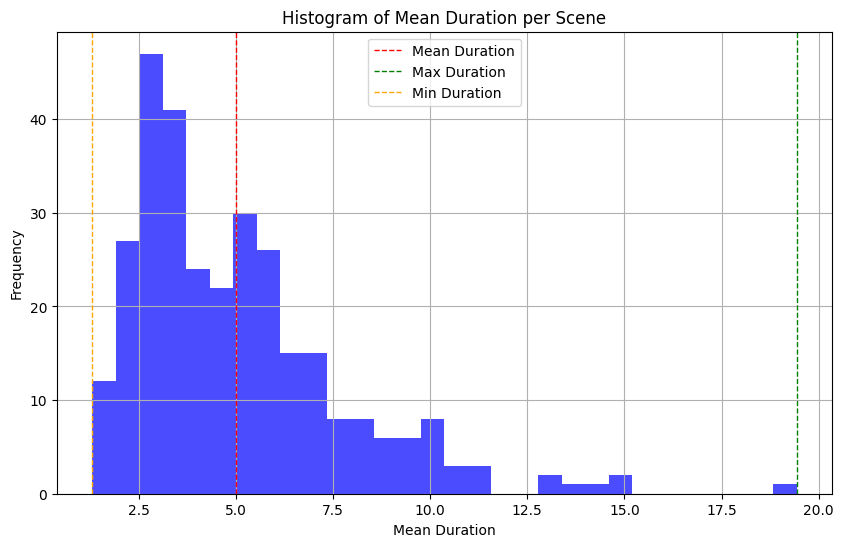

/tmp/ipykernel_82307/3707419314.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Duration", y="SceneFullName", data=mean_duration.sort_values("Duration"), palette="Set2")


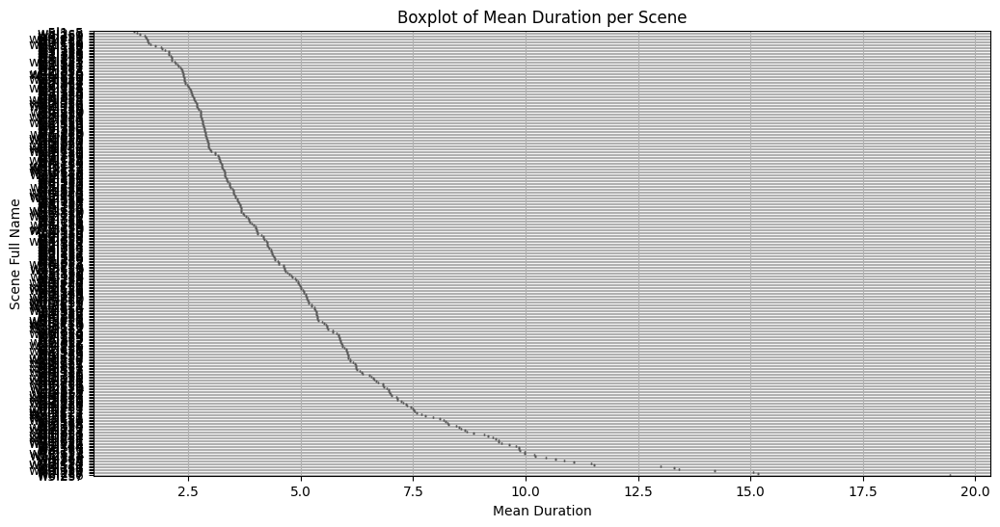

In [ ]:
human_df = full_df[full_df["Model"] == "human"]
# Get the mean Duration for each SceneFullName
mean_duration = (
    human_df.groupby(["SceneFullName"])["Duration"]
    .mean()
    .reset_index()
)
print(mean_duration.to_string())

total_average = mean_duration["Duration"].mean()
maximum = mean_duration["Duration"].max()
minimum = mean_duration["Duration"].min()
median = mean_duration["Duration"].median()
print(f"Total median duration: {median}")
print(f"Total average duration: {total_average}")
print(f"Maximum duration: {maximum}")
print(f"Minimum duration: {minimum}")
# Plot the histogram
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.hist(mean_duration["Duration"], bins=30, color='blue', alpha=0.7)
plt.axvline(total_average, color='red', linestyle='dashed', linewidth=1, label='Mean Duration')
plt.axvline(maximum, color='green', linestyle='dashed', linewidth=1, label='Max Duration')
plt.axvline(minimum, color='orange', linestyle='dashed', linewidth=1, label='Min Duration')
plt.title('Histogram of Mean Duration per Scene')
plt.xlabel('Mean Duration')
plt.ylabel('Frequency')
plt.legend()
plt.grid()
plt.show()

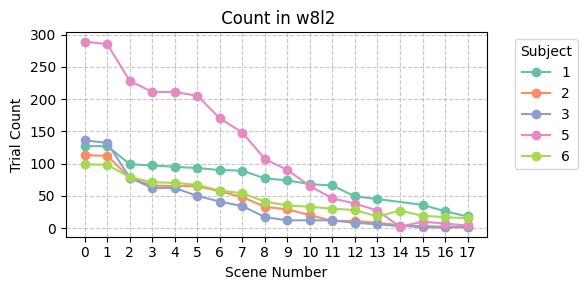

In [15]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_variable_by_scene(full_df, variable, level_name, ax=None, legend=True, legend_title=None, split_by='Model', ref_range=None, ref_df=None, figsize=(12, 6), title_prefix="", palette=None):
    """
    Plots a specified variable across scenes for a given level, with different colors for each model or subject.
    - 'Cleared' uses standard error for proportions.
    - 'Count' plots the count of observations per scene.
    - Other variables use std/sqrt(n) error bands.
    - Automatically chooses palette: 'Set2' for Subject, 'magma' for Model.
    """
    # Filter data for the specified level
    if split_by == 'Model':
        level_df = full_df[full_df['LevelFullName'] == level_name].copy()
    elif split_by == 'Subject':
        level_df = full_df[full_df['LevelFullName'] == level_name].copy()
        level_df = level_df[level_df['Model'] == 'human']

    # filter out scenes that have less than 10 trials
    level_df = level_df.groupby('Scene').filter(lambda x: len(x) >= 10)

    # Convert Scene to numeric for proper ordering
    level_df['Scene'] = pd.to_numeric(level_df['Scene'])

    # Setup figure if no axis is provided
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)

    # Auto-palette selection
    unique_keys = sorted(level_df[split_by].unique())
    if palette is None:
        if split_by == 'Subject':
            colors = sns.color_palette('Set2', n_colors=len(unique_keys))
        elif split_by == 'Model':
            cmap_human = plt.get_cmap('viridis')
            cmap_ppo = plt.get_cmap('magma')
            colors = [cmap_human(0.2), cmap_human(0.4), cmap_human(0.6), cmap_human(0.8)]
            colors.extend([cmap_ppo(x) for x in np.linspace(0.95, 0.5, len(unique_keys) - 4)])
        else:
            colors = sns.color_palette(n_colors=len(unique_keys))
        palette = dict(zip(unique_keys, colors))
    else:
        colors = sns.color_palette(palette, n_colors=len(unique_keys))
        palette = dict(zip(unique_keys, colors))

    if variable == 'Count':
        # Count number of entries per scene and model
        agg_df = level_df.groupby([split_by, 'Scene']).size().reset_index(name='count')
        for key, group in agg_df.groupby(split_by):
            ax.plot(
                group['Scene'],
                group['count'],
                marker='o',
                label=key,
                color=palette[key]
            )
    elif variable == 'Cleared':
        # For binary variable, compute mean and SE of proportions
        agg_df = level_df.groupby([split_by, 'Scene'])[variable].agg(['mean', 'count']).reset_index()
        agg_df.rename(columns={'mean': variable, 'count': 'n'}, inplace=True)
        agg_df['se'] = np.sqrt(agg_df[variable] * (1 - agg_df[variable]) / agg_df['n'])
        for key, group in agg_df.groupby(split_by):
            ax.plot(
                group['Scene'],
                group[variable],
                marker='o',
                label=key,
                color=palette[key],
                markeredgecolor='white',
                markeredgewidth=1
            )
            #ax.fill_between(
            #    group['Scene'],
            #    group[variable] - group['se'],
            #    group[variable] + group['se'],
            #    alpha=0.2,
            #    color=palette[key]
            #)
    else:
        # For continuous variables: mean and std/sqrt(n)
        agg_df = level_df.groupby([split_by, 'Scene'])[variable].agg(['mean', 'std', 'count']).reset_index()
        agg_df.rename(columns={'mean': variable, 'count': 'n'}, inplace=True)
        agg_df['se'] = agg_df['std'] / np.sqrt(agg_df['n'])
        for key, group in agg_df.groupby(split_by):
            ax.plot(
                group['Scene'],
                group[variable],
                marker='o',
                label=key,
                color=palette[key],
                markeredgecolor='white',
                markeredgewidth=1
            )
            #ax.fill_between(
            #    group['Scene'],
            #    group[variable] - group['se'],
            #    group[variable] + group['se'],
            #    alpha=0.2,
            #    color=palette[key]
            #)
    if ref_range == 'ppo':
        # Add reference range for PPO
        level_ref_df = ref_df[ref_df['LevelFullName'] == level_name]
        # Find PPO ranges, average by model checkpoint first
        ppo_means = level_ref_df.groupby(['Model', 'Scene'])[variable].mean().reset_index().sort_values('Scene')
        # Then get the unique scenes where at least one human completed it
        ppo_range = ppo_means['Scene'].unique()
        ppo_max = ppo_means.groupby('Scene')[variable].max().reset_index()
        ppo_min = ppo_means.groupby('Scene')[variable].min().reset_index()
        ppo_cmap = plt.get_cmap('magma')
        ppo_range_color = ppo_cmap(0.5)
        ax.fill_between(ppo_range, ppo_min[variable], ppo_max[variable], color=ppo_range_color, alpha=0.3, label='PPO Range')
        
    elif ref_range == 'human':
        # Add reference range for human
        level_ref_df = ref_df[ref_df['LevelFullName'] == level_name]
        level_ref_df = level_ref_df.groupby('Scene').filter(lambda x: len(x) >= 10)
        # Find human ranges, average by subject first
        human_subject_means = level_ref_df.groupby(['Subject', 'Scene'])[variable].mean().reset_index().sort_values('Scene')
        # Then get the unique scenes where at least one human completed it
        human_range = human_subject_means['Scene'].unique()
        human_max = human_subject_means.groupby('Scene')[variable].max().reset_index()
        human_min = human_subject_means.groupby('Scene')[variable].min().reset_index()
        human_cmap = plt.get_cmap('viridis')
        human_range_color = human_cmap(0.5)
        ax.fill_between(human_range, human_min[variable], human_max[variable], color=human_range_color, alpha=0.3, label='Human Range')

    # Improve the plot appearance
    title = f"{title_prefix} {variable} in {level_name}"
    ax.set_title(title)
    ax.set_xlabel('Scene Number')
    ax.set_ylabel(variable if variable != 'Count' else 'Trial Count')

    # Force x-axis to have integer ticks at each scene number
    scene_values = sorted(level_df['Scene'].unique())
    ax.set_xticks(scene_values)

    # If boolean, lock y-axis
    if variable == 'Cleared':
        ax.set_ylim(-0.05, 1.05)

    # Add grid
    ax.grid(True, linestyle='--', alpha=0.7)

    # Add legend
    if legend:
        ax.legend(title=split_by, bbox_to_anchor=(1.05, 1), loc='upper left')
        if legend_title:
            ax.legend_.set_title(legend_title)


    plt.tight_layout()
    return fig if ax is None else ax


# Example usage:
fig = plot_variable_by_scene(full_df, 'Count', 'w8l2', split_by='Subject', figsize=(6, 3))
plt.show()

In [16]:
levels_list = full_df['LevelFullName'].unique()
full_df['Average_speed'] = full_df['X_Traveled'].astype(float)/full_df['Duration'].astype(float)

discovery_df = full_df[full_df['Phase'] == 'discovery']
practice_df = full_df[full_df['Phase'] == 'practice']
models_df = full_df[full_df['Model'] != 'human']
humans_df = full_df[full_df['Model'] == 'human']

<Axes: title={'center': 'Total :  Cleared in w8l2'}, xlabel='Scene Number', ylabel='Cleared'>

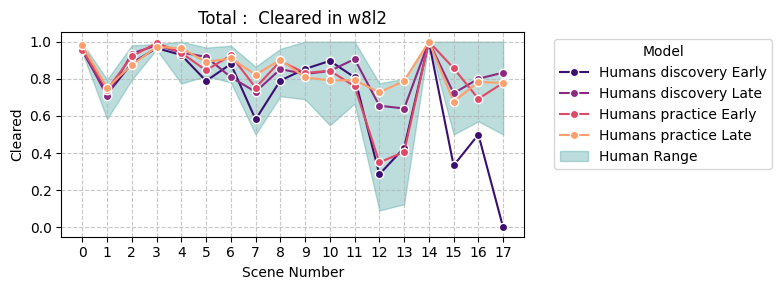

In [17]:
phasesplit_df = full_df.copy()
phasesplit_df = phasesplit_df[phasesplit_df['Model'] == 'human']
phasesplit_df.loc[phasesplit_df["Model"] == 'human', "Model"] = 'Humans ' + phasesplit_df['Phase'] + ' ' + phasesplit_df['Phase_stage']

plot_variable_by_scene(phasesplit_df, 'Cleared','w8l2', ax=None, ref_range='human', ref_df=humans_df, split_by='Model', legend=True, title_prefix='Total : ', figsize=(8,3), palette='magma')

<Axes: title={'center': 'Total :  Cleared in w8l2'}, xlabel='Scene Number', ylabel='Cleared'>

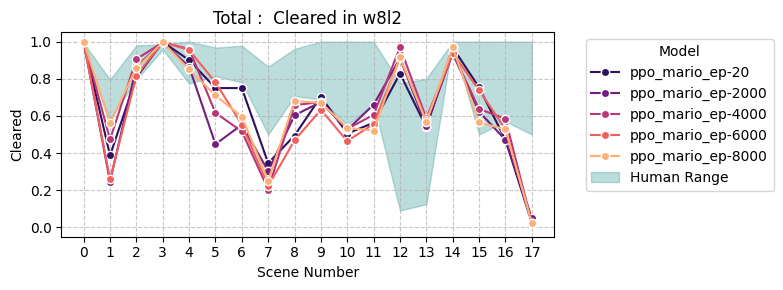

In [18]:
# keep only the models with 'ppo' in their name
ppo_df = full_df[full_df['Model'].str.contains('ppo')]
plot_variable_by_scene(ppo_df, 'Cleared','w8l2', ax=None, ref_range='human', ref_df=humans_df, split_by='Model', legend=True, title_prefix='Total : ', figsize=(8,3), palette='magma')


<Axes: title={'center': 'Total :  Cleared in w8l2'}, xlabel='Scene Number', ylabel='Cleared'>

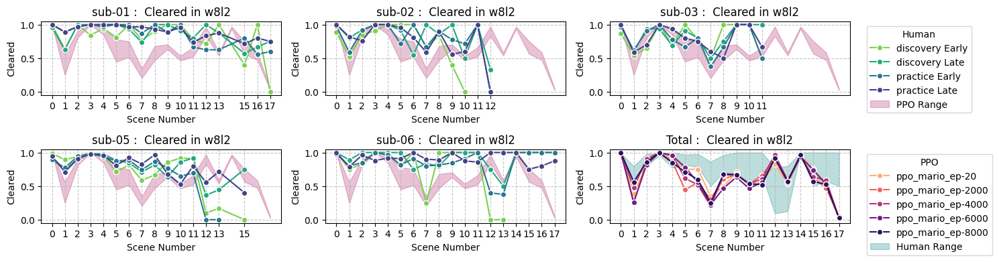

In [19]:
fig, axes = plt.subplots(2, 3, figsize=(15, 4))
axes = axes.flatten()

for idx, sub in enumerate([1,2,3,5,6]):
    phasesplit_df = full_df[full_df['Model'] == 'human']
    human_mask = (phasesplit_df['Model'] == 'human')
    subject_not_1_mask = (phasesplit_df['Subject'] != sub)
    phasesplit_df = phasesplit_df[~(human_mask & subject_not_1_mask)]
    phasesplit_df.loc[phasesplit_df["Model"] == 'human', "Model"] = phasesplit_df['Phase'] + ' ' + phasesplit_df['Phase_stage']
    if idx == 2:
        legend = True
    else:
        legend = False
    plot_variable_by_scene(phasesplit_df, 'Cleared','w8l2', ax=axes[idx], ref_range='ppo', ref_df=models_df, split_by='Model', legend=legend, legend_title='Human', title_prefix=f'sub-0{sub} : ', palette='viridis_r')


ppo_df = full_df[full_df['Model'].str.contains('ppo')]
plot_variable_by_scene(ppo_df, 'Cleared','w8l2', ax=axes[-1], ref_range='human', ref_df=humans_df, split_by='Model', legend=True, legend_title='PPO', title_prefix='Total : ', palette='magma_r')

<Axes: title={'center': 'Total :  Cleared in w4l3'}, xlabel='Scene Number', ylabel='Cleared'>

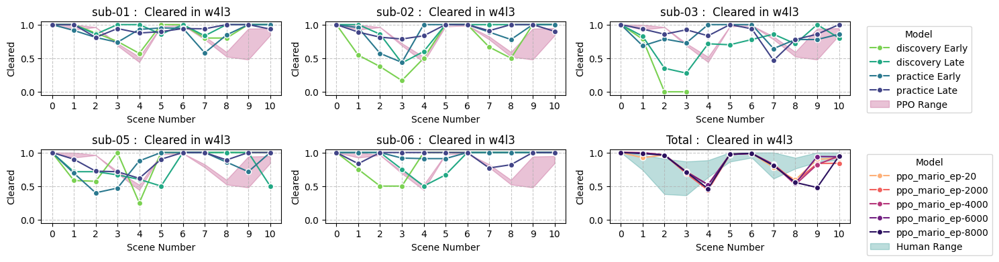

In [ ]:
level = 'w4l3'

fig, axes = plt.subplots(2, 3, figsize=(15, 4))
axes = axes.flatten()

for idx, sub in enumerate([1,2,3,5,6]):
    phasesplit_df = full_df[full_df['Model'] == 'human']
    human_mask = (phasesplit_df['Model'] == 'human')
    subject_not_1_mask = (phasesplit_df['Subject'] != sub)
    phasesplit_df = phasesplit_df[~(human_mask & subject_not_1_mask)]
    phasesplit_df.loc[phasesplit_df["Model"] == 'human', "Model"] = phasesplit_df['Phase'] + ' ' + phasesplit_df['Phase_stage']
    if idx == 2:
        legend = True
    else:
        legend = False
    plot_variable_by_scene(phasesplit_df, 'Cleared',level, ax=axes[idx], ref_range='ppo', ref_df=models_df, split_by='Model', legend=legend, title_prefix=f'sub-0{sub} : ', palette='viridis_r')


ppo_df = full_df[full_df['Model'].str.contains('ppo')]
plot_variable_by_scene(ppo_df, 'Cleared',level, ax=axes[-1], ref_range='human', ref_df=humans_df, split_by='Model', legend=True, title_prefix='Total : ', palette='magma_r')

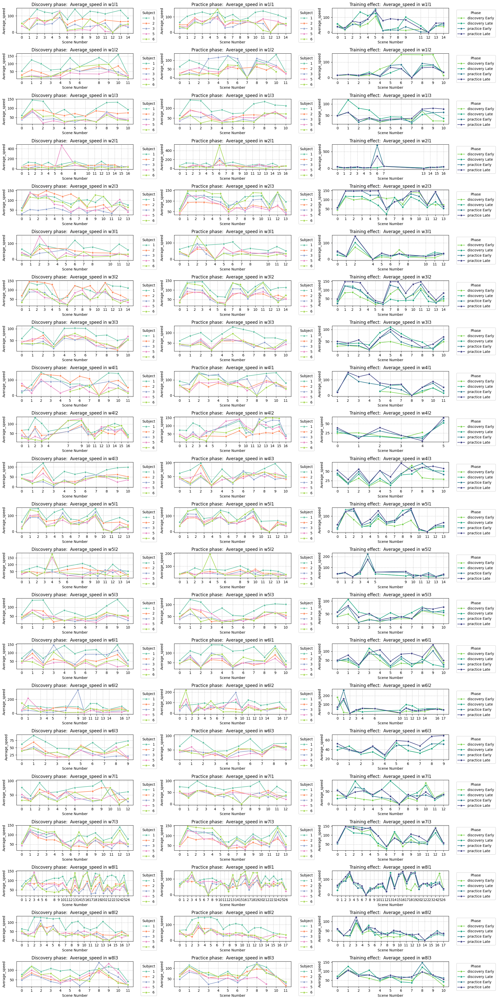

In [27]:
## Average speed
fig, axes = plt.subplots(22, 3, figsize=(20, 40))

for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(discovery_df, 'Average_speed', level, ax=axes[idx,0], split_by='Subject', legend=True, title_prefix='Discovery phase: ')
for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(practice_df, 'Average_speed', level, ax=axes[idx,1], split_by='Subject', legend=True, title_prefix='Practice phase: ')
for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(phasesplit_df, 'Average_speed', level, ax=axes[idx,2], split_by='Model', legend=True, legend_title='Phase', title_prefix='Training effect: ', palette='viridis_r')

plt.show(fig)

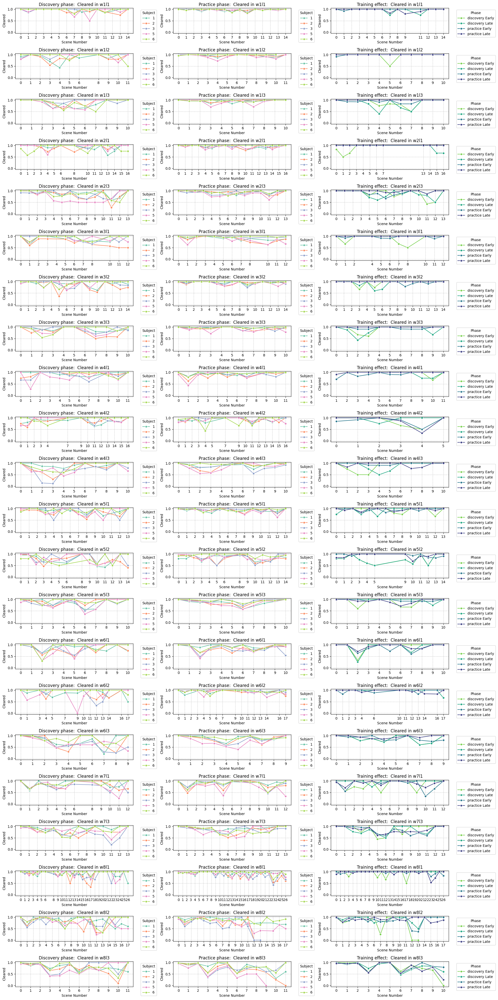

In [28]:
fig, axes = plt.subplots(22, 3, figsize=(20, 40))

levels_list = full_df['LevelFullName'].unique()

for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(discovery_df, 'Cleared', level, ax=axes[idx,0], split_by='Subject', legend=True, title_prefix='Discovery phase: ')
for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(practice_df, 'Cleared', level, ax=axes[idx,1], split_by='Subject', legend=True, title_prefix='Practice phase: ')
for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(phasesplit_df, 'Cleared', level, ax=axes[idx,2], split_by='Model', legend=True, legend_title='Phase', title_prefix='Training effect: ', palette='viridis_r')


plt.show(fig)

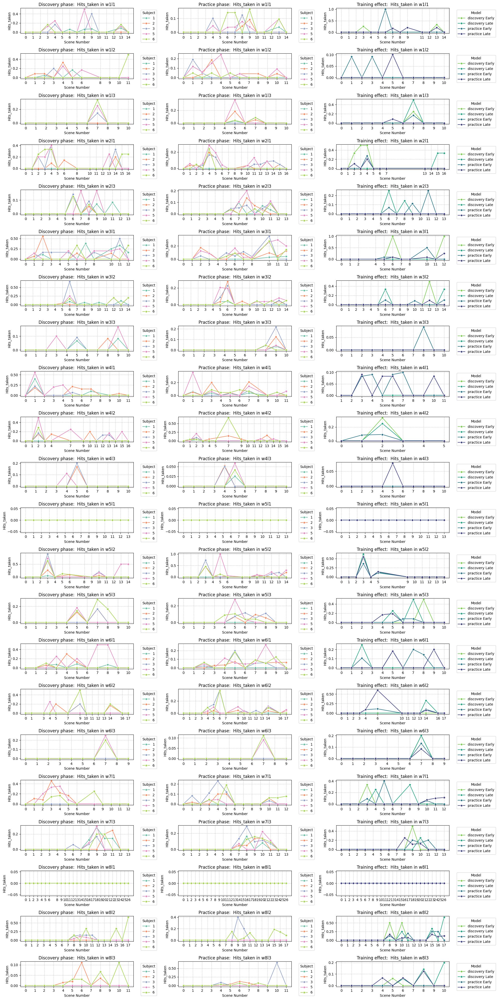

In [29]:
fig, axes = plt.subplots(22, 3, figsize=(20, 40))

levels_list = full_df['LevelFullName'].unique()

for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(discovery_df, 'Hits_taken', level, ax=axes[idx,0], split_by='Subject', legend=True, title_prefix='Discovery phase: ')
for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(practice_df, 'Hits_taken', level, ax=axes[idx,1], split_by='Subject', legend=True, title_prefix='Practice phase: ')
for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(phasesplit_df, 'Hits_taken', level, ax=axes[idx,2], split_by='Model', legend=True, title_prefix='Training effect: ', palette='viridis_r')


plt.show(fig)

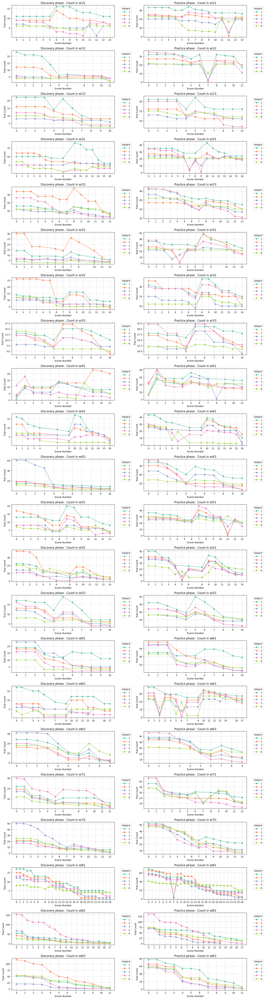

In [31]:
fig, axes = plt.subplots(22, 2, figsize=(16, 60))

levels_list = full_df['LevelFullName'].unique()


for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(discovery_df, 'Count', level, ax=axes[idx,0], split_by='Subject', legend=True, title_prefix='Discovery phase: ')


for idx, level in enumerate(sorted(levels_list)):
    plot_variable_by_scene(practice_df, 'Count', level, ax=axes[idx,1], split_by='Subject', legend=True, title_prefix='Practice phase: ')


plt.show(fig)

In [ ]:
full_df[full_df['LevelFullName']== 'w8l2']['Subject'].

TypeError: 'int' object is not callable

<Axes: title={'center': 'Total :  Cleared in w8l2'}, xlabel='Scene Number', ylabel='Cleared'>

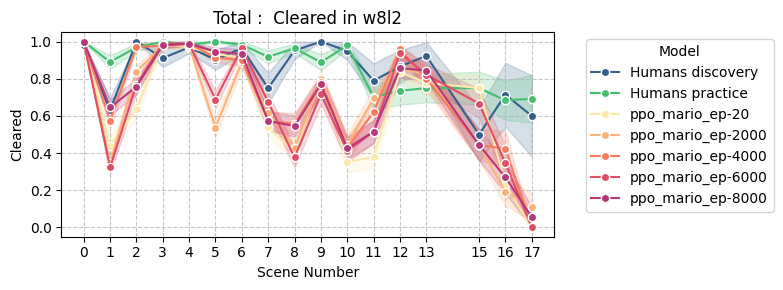

In [61]:
phasesplit_df

,Model,StateFileName,LevelFullName,Scene,ClipCode,TotalFrames,Bk2Filepath,GameName,Subject,World,...,Session,Run,StartFrame,EndFrame,Bk2File,SceneFullName,IndexInRun,IndexGlobal,IndexLevel,Phase
0,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l1,0,101000000122,127,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l1,0,101010000122,127,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l1,0,101020000122,127,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l1,0,101030000122,127,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ppo_mario_ep-20,scene_clips/sub-01/ses-001/beh/savestates/sub-...,w1l1,0,101040000122,127,ppo_mario_ep-20/sub-01/ses-001/beh/bk2/sub-01_...,SuperMarioBros-Nes,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336841,Humans practice,NaN,w6l2,12,2504030006642,12456,NaN,SuperMarioBros-Nes,6,6,...,25.0,4.0,6642.0,6825.0,sub-06_ses-025_run-04_level-w6l2_scene-12_clip...,w6l2s12,3.0,604.0,24.0,practice
336842,Humans practice,NaN,w6l2,12,2504030010047,12456,NaN,SuperMarioBros-Nes,6,6,...,25.0,4.0,10047.0,10276.0,sub-06_ses-025_run-04_level-w6l2_scene-12_clip...,w6l2s12,3.0,604.0,24.0,practice
336843,Humans practice,NaN,w6l2,13,2504030006825,12456,NaN,SuperMarioBros-Nes,6,6,...,25.0,4.0,6825.0,7320.0,sub-06_ses-025_run-04_level-w6l2_scene-13_clip...,w6l2s13,3.0,604.0,24.0,practice
336844,Humans practice,NaN,w6l2,13,2504030010276,12456,NaN,SuperMarioBros-Nes,6,6,...,25.0,4.0,10276.0,10742.0,sub-06_ses-025_run-04_level-w6l2_scene-13_clip...,w6l2s13,3.0,604.0,24.0,practice


In [10]:
models_df['Average_speed']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
         ..
56136   NaN
56137   NaN
56138   NaN
56139   NaN
56140   NaN
Name: Average_speed, Length: 280705, dtype: float64